# helper functions
https://github.com/QCoDeS/Qcodes/blob/master/docs/examples/driver_examples/Qcodes%20example%20with%20Rohde%20Schwarz%20ZNB.ipynb 

In [1]:
import os, sys
import matplotlib.pyplot as plt
import qcodes as qc
import numpy as np
from datetime import datetime, timedelta


#import instrument
import qcodes.instrument_drivers.rohde_schwarz.ZNB as ZNB

from qcodes.dataset.measurements import Measurement
from qcodes.dataset.plotting import plot_by_id, load_by_id
from qcodes.dataset.data_export import get_data_by_id


#Analysis
#from characterizations.characterizations import resonators as res
#from characterizations.characterizations.fitter import fit

In [2]:
%matplotlib inline

In [5]:
#initialize database
import datetime

def initialize_database(datestamp='20190602', dataset_name = 'ABS_W1_3_RES', path=r'D:\OneDrive\BF3\Data\\'):
    """
    Quick helper function that sets the database
    """
    qc.config["core"]["db_location"] = datetime.date.today().strftime(path+datestamp+'_'+dataset_name+'.db')
    qc.dataset.database.initialise_database()
    print("database set to",qc.config.core.db_location)

In [6]:
#initialize database
initialize_database('20190628')

database set to D:\OneDrive\BF3\Data\\20190628_ABS_W1_3_RES.db


In [7]:
def get_f0s_from_data(data_id):
    data = load_by_id(data_id)
    freqs = np.squeeze(np.array(data.get_data('frequency')))
    mag = np.squeeze(np.array(data.get_data('magnitude_dB')))
    amp = np.squeeze(np.array(data.get_data('mag')))
    phase = np.squeeze(np.array(data.get_data('phase')))
    #gates = np.squeeze(np.array(data.get_data('V_cut_A')))

    f0s = freqs[1,np.argmin(mag[:,:],axis=1)]
    return f0s

def unpack_data(data_id, col_names = ['frequency', 'mag', 'phase', 'magnitude_dB']):
    """ 
    Just loads the data from database to numpy arrays
    specifying columns with the list arguments
    """
    data = load_by_id(data_id)
    data_dict = {}
    for col_name in col_names:
        data_dict[col_name] = np.squeeze(np.array(data.get_data(col_name))) #somehow they added empty dimensions in qcodes. or maybe that is just my bad saving 
    
    return data_dict

def plot_readout_point_from_sweep(plot_id, f_readout = 4.84700e9):
    """
    plots readout point in mag vs phase resonance sweep. 
    """
    dat = unpack_data(plot_id, col_names=['frequency', 'phase', 'magnitude_dB', 'magnitude_raw'])
    plt.figure()
    plt.plot(dat['frequency'],dat['magnitude_raw'], '--')
    plt.ylabel('mag')
    plt.twinx()
    plt.plot(dat['frequency'],dat['phase'], '--g')
    plt.axvline(x=f_readout,color='r')
    plt.title('Readout point sweep for sweep #%d, id=#%d' % (plot_id+1, plot_id))
    plt.ylabel('phase')

# frequency analysis of field scans

In [8]:
def plot_fft(data_id):
    data = unpack_data(data_id, col_names = ['B_y', 'mag', 'phase'])
    plt.figure(figsize=(15,4))
    plt.plot( np.fft.fftfreq(len(data['mag']), d=(data['B_y'][1]-data['B_y'][0])),np.abs(np.fft.fft(data['mag'])))
    plt.ylim(0,1)
    
def get_fft(data_id, imin=0, imax=-1):
    data = unpack_data(data_id, col_names = ['B_y', 'mag', 'phase'])
    freqs = np.fft.fftfreq(len(data['mag'][imin:imax]), d=(data['B_y'][1]-data['B_y'][0]))
    mag_fft = np.abs(np.fft.fft(data['mag'][imin:imax]))
    phase_fft = np.abs(np.fft.fft(data['phase'][imin:imax]))
    return freqs, mag_fft, phase_fft
   

# Analysis of 06-28 data

Text(0.5, 1.0, 'Temperature vs index of imshowplot')

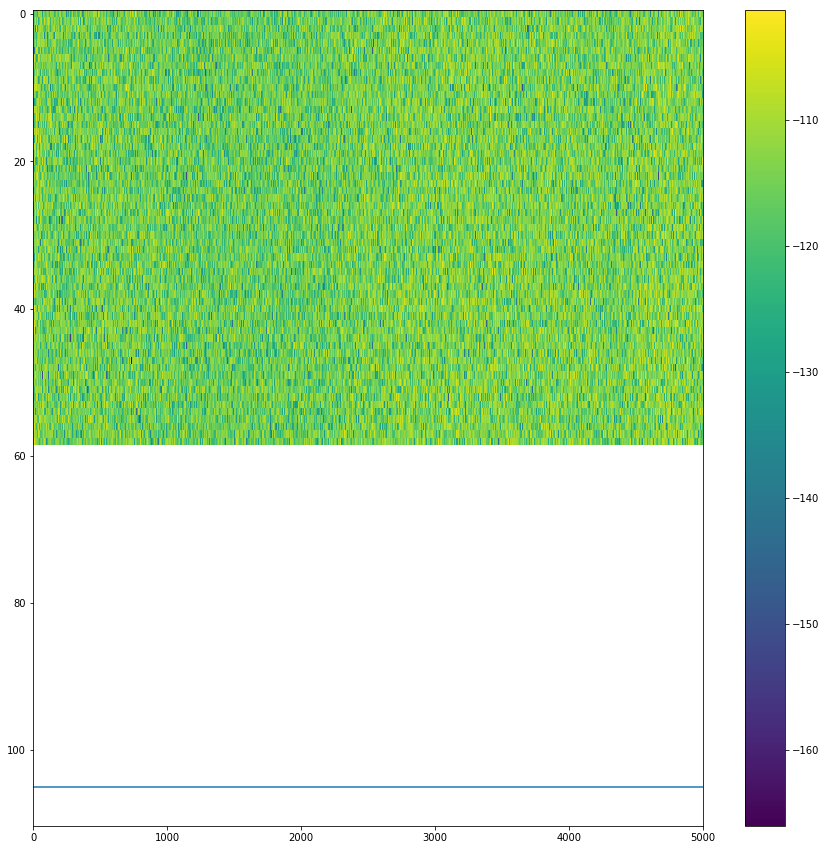

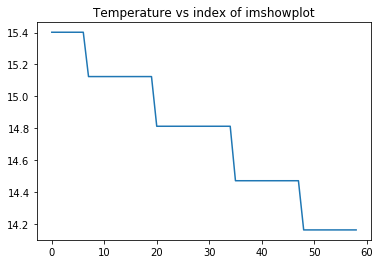

In [10]:
dat = load_by_id(2)
plt.figure(figsize=(15,15))
plt.imshow(np.squeeze(dat.get_data('magnitude_dB')), aspect='auto')
plt.colorbar()
plt.axhline(y=105)
plt.figure()
plt.plot(np.squeeze(dat.get_data('temperature')))
plt.title('Temperature vs index of imshowplot')
#print(np.squeeze(dat.get_data('temperature'))[105])
#print(np.squeeze(dat.get_data('temperature'))[200])

10.3651


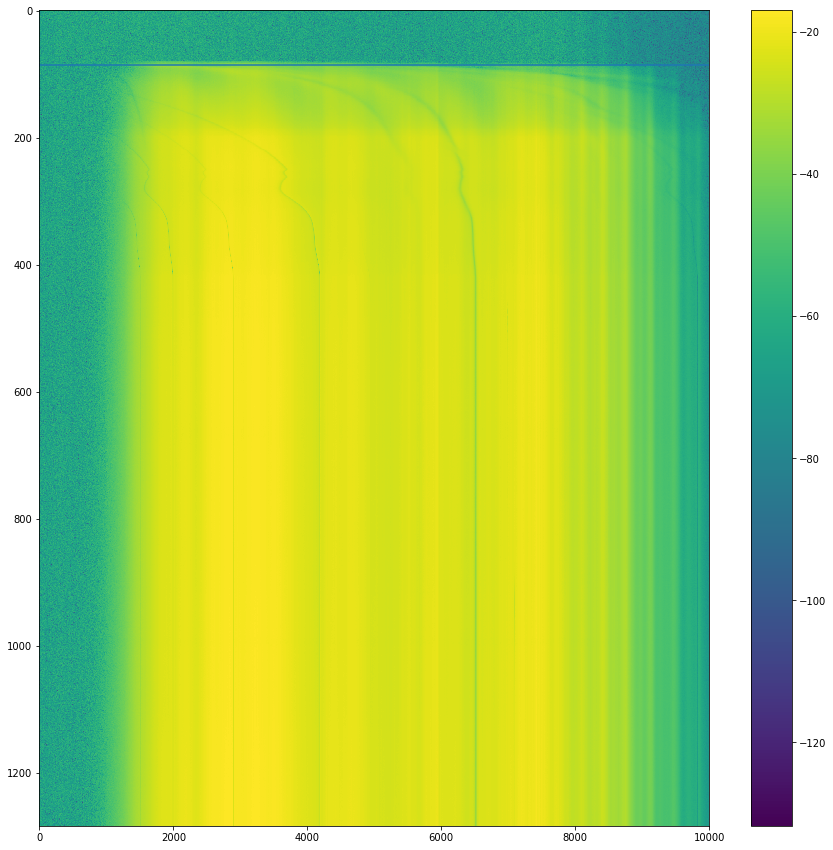

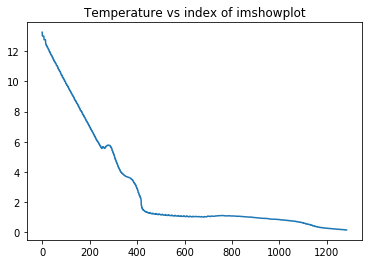

In [72]:
dat = load_by_id(3)
plt.figure(figsize=(15,15))
plt.imshow(np.squeeze(dat.get_data('magnitude_dB')), aspect='auto')
plt.colorbar()
plt.axhline(y=85)
plt.figure()
plt.plot(np.squeeze(dat.get_data('temperature')))
plt.title('Temperature vs index of imshowplot')
print(np.squeeze(dat.get_data('temperature'))[85])
#print(np.squeeze(dat.get_data('temperature'))[200])

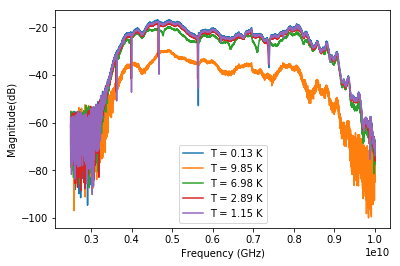

In [73]:
plt.plot(np.squeeze(dat.get_data('frequency'))[-1,:],np.squeeze(dat.get_data('magnitude_dB'))[-1,:], label=('T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[-1])))
plt.plot(np.squeeze(dat.get_data('frequency'))[100,:],np.squeeze(dat.get_data('magnitude_dB'))[100,:], label=('T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[100])))
plt.plot(np.squeeze(dat.get_data('frequency'))[200,:],np.squeeze(dat.get_data('magnitude_dB'))[200,:], label=('T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[200])))
plt.plot(np.squeeze(dat.get_data('frequency'))[400,:],np.squeeze(dat.get_data('magnitude_dB'))[400,:], label=('T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[400])))
plt.plot(np.squeeze(dat.get_data('frequency'))[500,:],np.squeeze(dat.get_data('magnitude_dB'))[500,:], label=('T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[500])))

plt.ylabel('Magnitude(dB)')
plt.xlabel('Frequency (GHz)')
plt.legend()

In [34]:
np.squeeze(dat.get_data('temperature'))[-1]

8.37388

In [37]:
'T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[-1])

'T = 8.17 C'

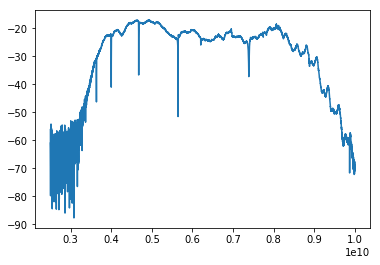

In [75]:
plt.plot(np.squeeze(dat.get_data('frequency'))[0,:],np.squeeze(dat.get_data('magnitude_dB'))[-1,:], label=('T = %.2f K' % (np.squeeze(dat.get_data('temperature'))[-1])))


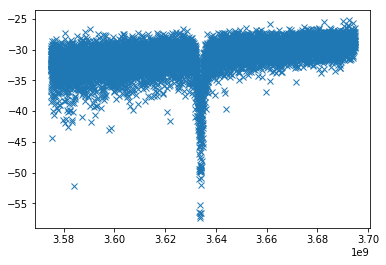

In [79]:
dat = unpack_data(7, col_names=['magnitude_dB', 'frequency'])

plt.plot(dat['frequency'], dat['magnitude_dB']  ,'x')

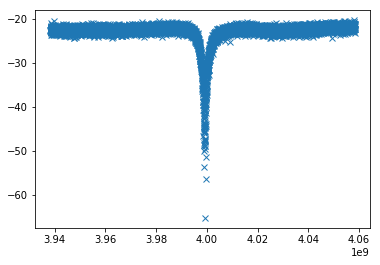

In [80]:
dat = unpack_data(8, col_names=['magnitude_dB', 'frequency'])

plt.plot(dat['frequency'], dat['magnitude_dB']  ,'x')

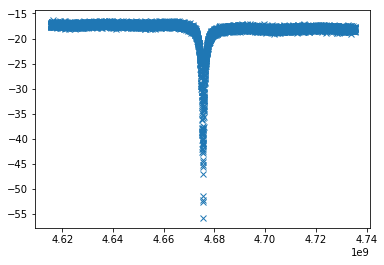

In [81]:
dat = unpack_data(9, col_names=['magnitude_dB', 'frequency'])

plt.plot(dat['frequency'], dat['magnitude_dB']  ,'x')

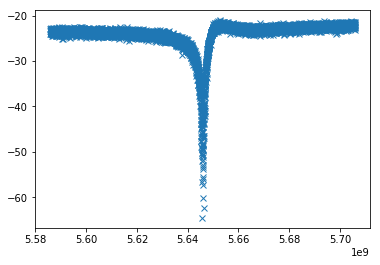

In [82]:
dat = unpack_data(10, col_names=['magnitude_dB', 'frequency'])

plt.plot(dat['frequency'], dat['magnitude_dB']  ,'x')

([<matplotlib.axes._subplots.AxesSubplot at 0x1da77dade10>,
  <matplotlib.colorbar.Colorbar at 0x1da77e6c080>])

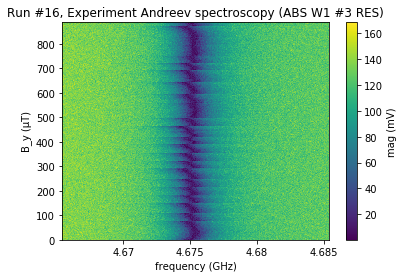

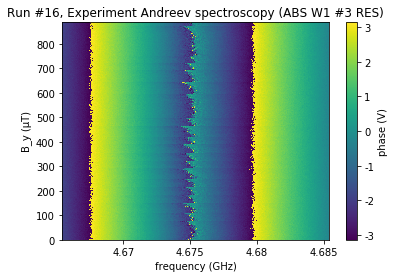

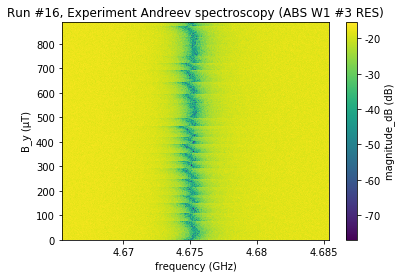

In [114]:
plot_by_id(16)

In [109]:
np.sqrt(2e-15 / (60e-6))

5.773502691896258e-06

([<matplotlib.axes._subplots.AxesSubplot at 0x1daac9d36a0>,
  <matplotlib.colorbar.Colorbar at 0x1da0d9a2278>])

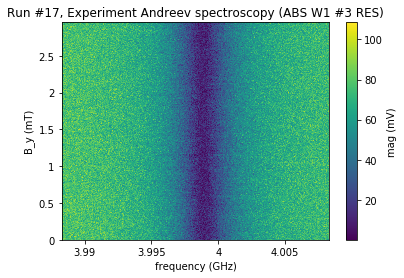

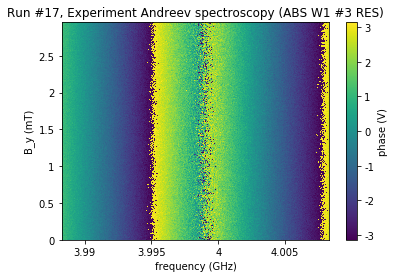

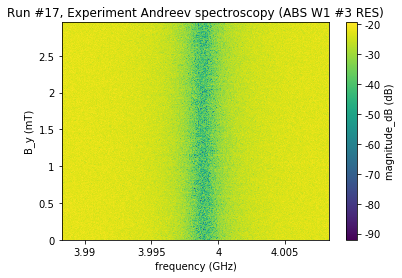

In [115]:
plot   _by_id(17)

In [120]:
dat = load_by_id(17)

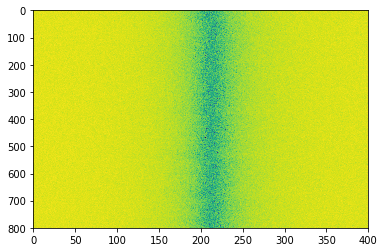

In [132]:
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))


plt.imshow(mags[0:800,:], aspect='auto' )

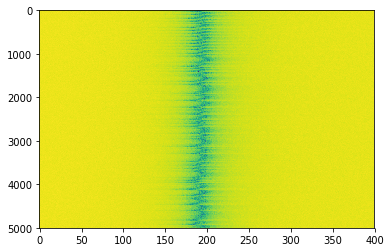

In [144]:
dat = load_by_id(18)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))


plt.imshow(mags[800:-1,:], aspect='auto' )

([<matplotlib.axes._subplots.AxesSubplot at 0x1dbd07d9400>,
  <matplotlib.colorbar.Colorbar at 0x1dad3bb87b8>])

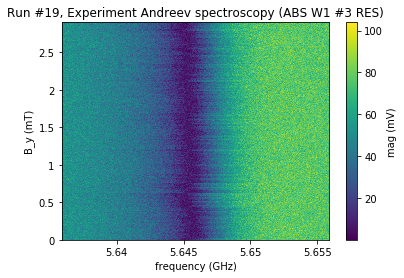

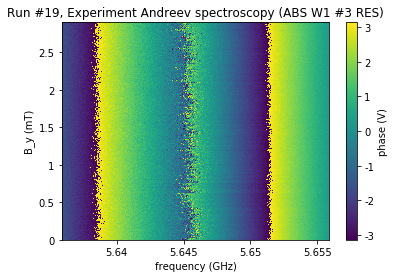

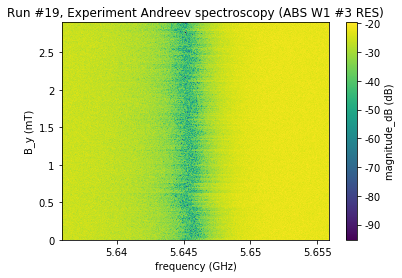

In [156]:
plot_by_id(19)

([<matplotlib.axes._subplots.AxesSubplot at 0x1dad3ffa208>,
  <matplotlib.colorbar.Colorbar at 0x1da7a1cbef0>])

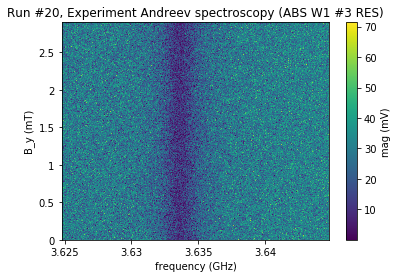

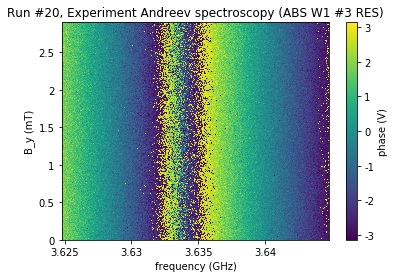

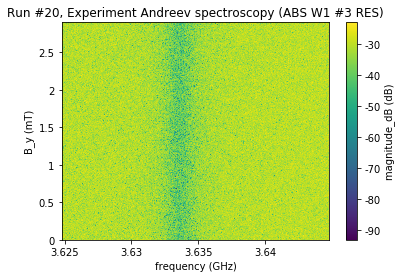

In [157]:
plot_by_id(20)

IndexError: index 0 is out of bounds for axis 0 with size 0

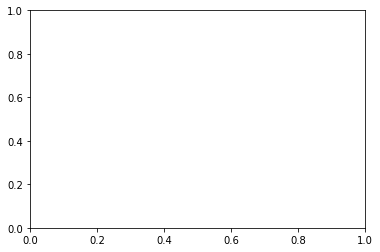

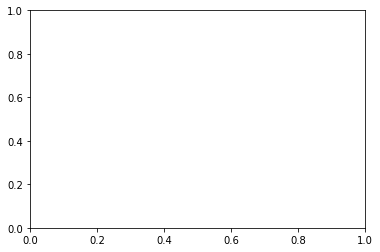

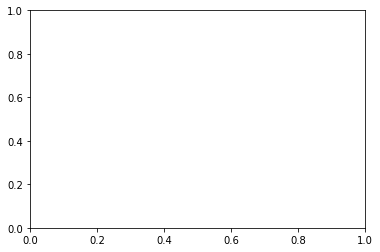

In [196]:
plot_by_id(21)

([<matplotlib.axes._subplots.AxesSubplot at 0x1db4a2a9b38>,
  <matplotlib.colorbar.Colorbar at 0x1dc1a5b7400>])

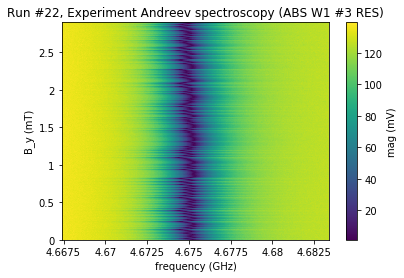

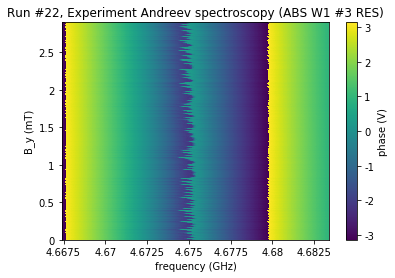

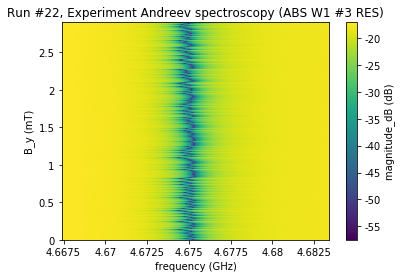

In [158]:
plot_by_id(22)

([<matplotlib.axes._subplots.AxesSubplot at 0x1db49c06b38>,
  <matplotlib.colorbar.Colorbar at 0x1dc1a5494e0>])

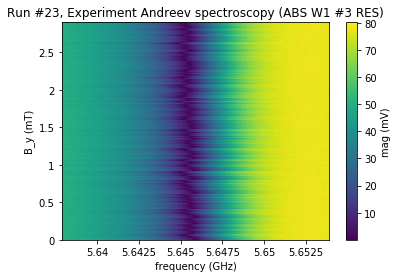

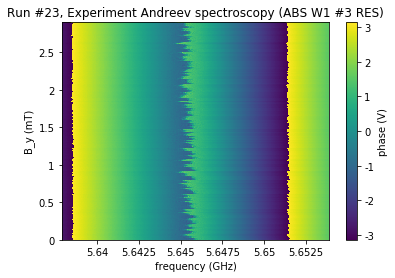

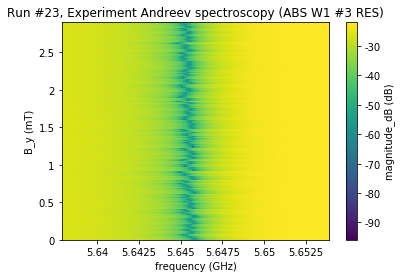

In [160]:
plot_by_id(23)

In [331]:
plot_by_id(24)

ValueError: Run with run_id 24 does not exist in the database

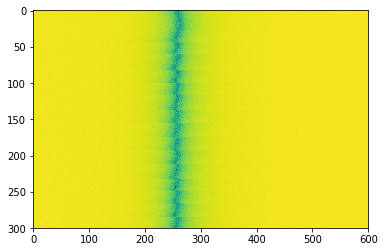

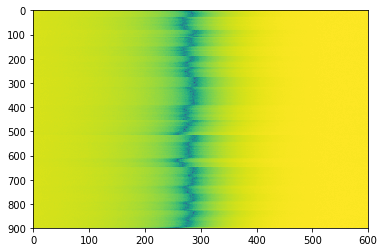

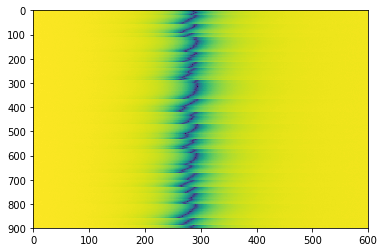

In [277]:
dat = load_by_id(24)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))


plt.imshow(mags[0:300,:], aspect='auto' )

dat = load_by_id(23)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()

plt.imshow(mags[2000:-1,:], aspect='auto' )

dat = load_by_id(22)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()

plt.imshow(mags[2000:-1,:], aspect='auto' )

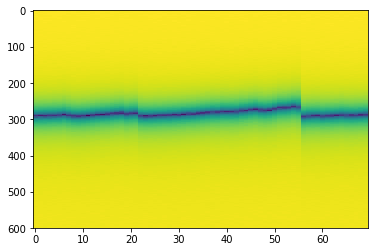

In [184]:
plt.imshow(mags[2000:2070,:].T,aspect='auto')


([<matplotlib.axes._subplots.AxesSubplot at 0x1db8856a8d0>,
  <matplotlib.colorbar.Colorbar at 0x1dbce176160>])

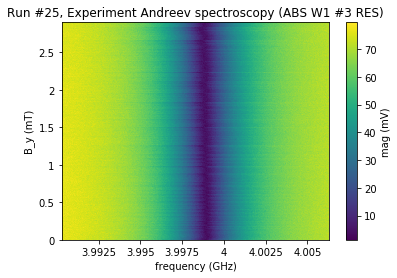

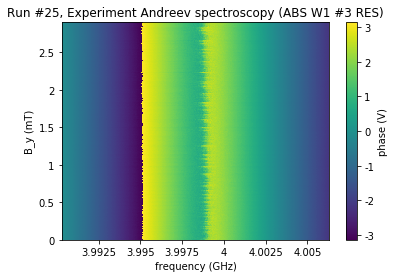

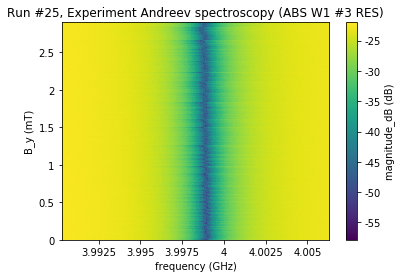

In [190]:
plot_by_id(25)

([<matplotlib.axes._subplots.AxesSubplot at 0x1db8858bb70>,
  <matplotlib.colorbar.Colorbar at 0x1dc9e07fa20>])

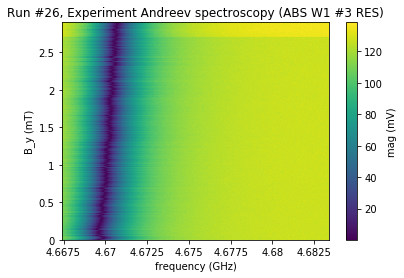

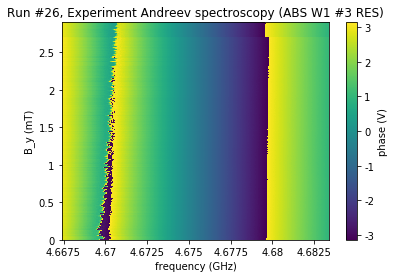

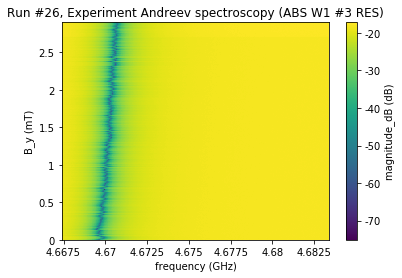

In [189]:
plot_by_id(26)

Text(0, 0.5, 'B Field')

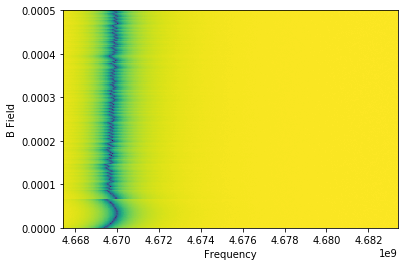

In [228]:
#dat = load_by_id(26)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()

max_index = 500
plt.imshow(mags[max_index:0:-1,:], aspect='auto' , extent=[freqs[0,0], freqs[0,-1], B_fields[0], B_fields[max_index]])
plt.xlabel('Frequency')
plt.ylabel('B Field')

([<matplotlib.axes._subplots.AxesSubplot at 0x1dc1c69f5f8>,
  <matplotlib.colorbar.Colorbar at 0x1dc1d936240>])

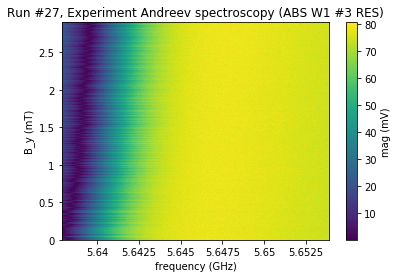

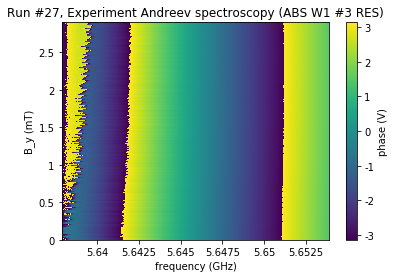

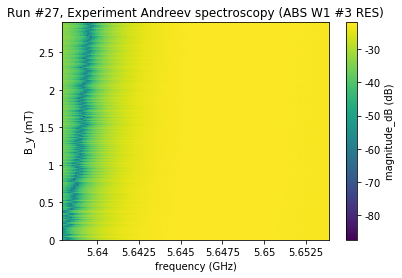

In [198]:
plot_by_id(27)

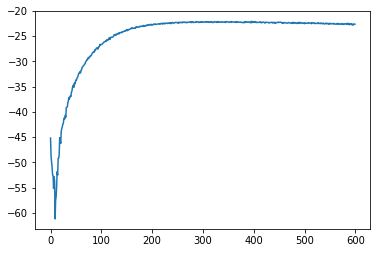

In [199]:
plt.figure()
plt.plot(mags[0,:])

In [205]:
f0s = get_f0s_from_data(23)

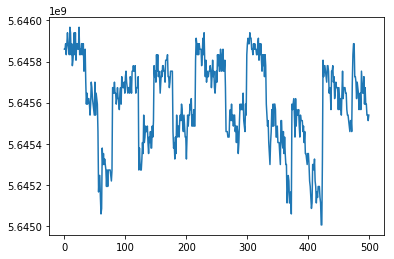

In [207]:
plt.plot(f0s[0:500])

In [208]:
f0s_22 = get_f0s_from_data(22)

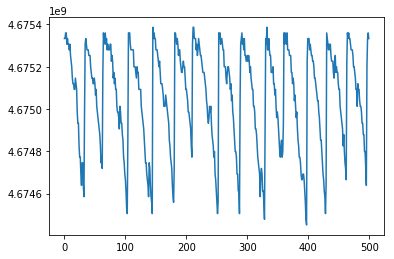

In [209]:
plt.plot(f0s_22[0:500])

In [211]:
f0s_24 = get_f0s_from_data(24)
plt.plot(f0s_21[0:500])

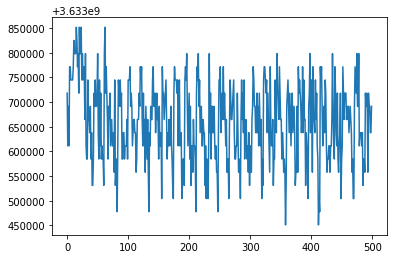

In [214]:
plt.plot(f0s_21[0:500])

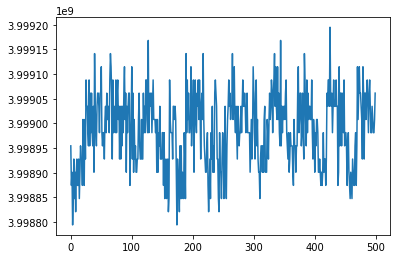

In [215]:
f0s_25 = get_f0s_from_data(25)
plt.plot(f0s_25[0:500])

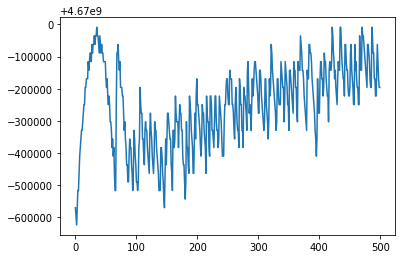

In [219]:
f0s_25 = get_f0s_from_data(26)
plt.plot(f0s_25[0:500])

([<matplotlib.axes._subplots.AxesSubplot at 0x1dcab228128>,
  <matplotlib.colorbar.Colorbar at 0x1dcb2edc0b8>])

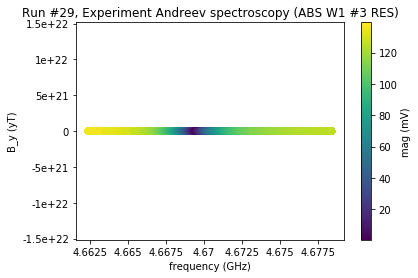

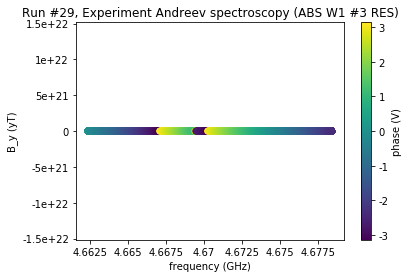

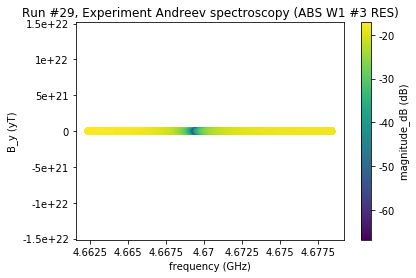

In [230]:
plot_by_id(29)

Text(0, 0.5, 'index of sweep(0 field for all)')

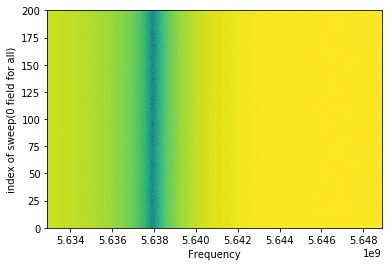

In [245]:
dat = load_by_id(30)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()


plt.imshow(mags, aspect='auto', extent=[freqs[0,0], freqs[0,-1], 0 ,200])
plt.xlabel('Frequency')
plt.ylabel('index of sweep(0 field for all)')

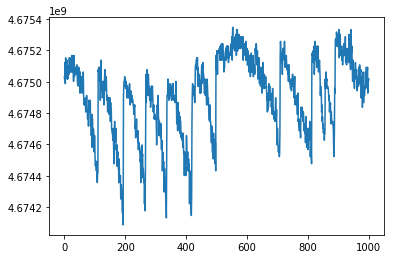

In [267]:
f0s_25 = get_f0s_from_data(33)
plt.plot(f0s_25)

Text(0, 0.5, 'index of sweep(0 field for all)')

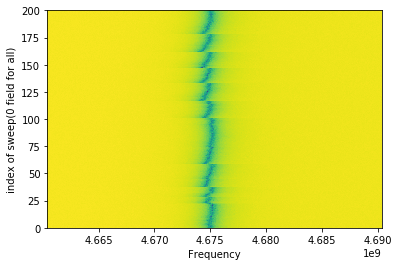

In [260]:
dat = load_by_id(33)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()


plt.imshow(mags, aspect='auto', extent=[freqs[0,0], freqs[0,-1], 0 ,200])
plt.xlabel('Frequency')
plt.ylabel('index of sweep(0 field for all)')

([<matplotlib.axes._subplots.AxesSubplot at 0x1dcf18042b0>,
  <matplotlib.colorbar.Colorbar at 0x1dcf4437f60>])

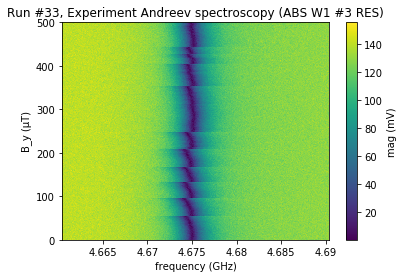

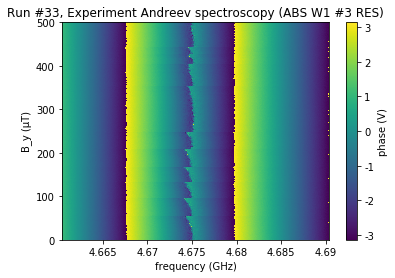

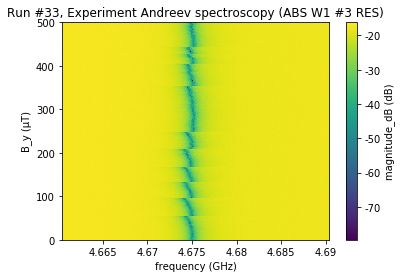

In [261]:
plot_by_id(33)

([<matplotlib.axes._subplots.AxesSubplot at 0x1dcecc319e8>,
  <matplotlib.colorbar.Colorbar at 0x1dcf022a3c8>])

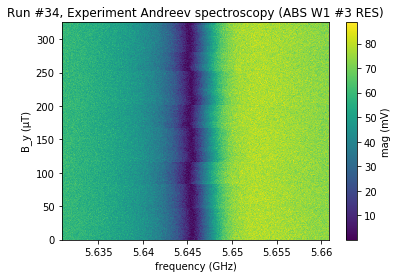

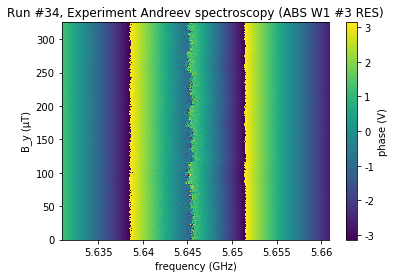

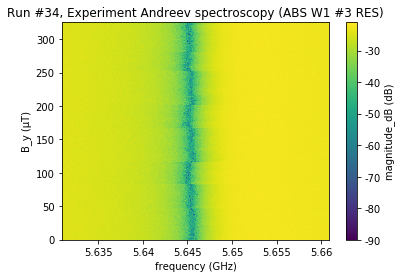

In [255]:
plot_by_id(34)

([<matplotlib.axes._subplots.AxesSubplot at 0x1dcf048c390>,
  <matplotlib.colorbar.Colorbar at 0x1dcf42c3828>])

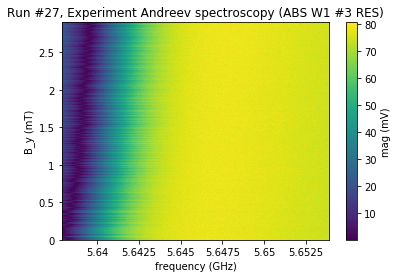

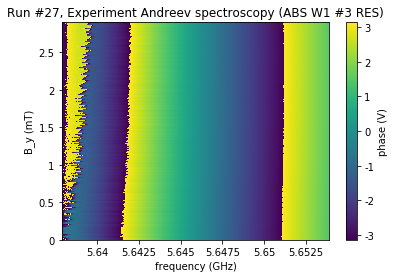

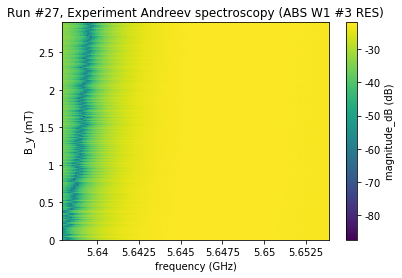

In [259]:
plot_by_id(27)

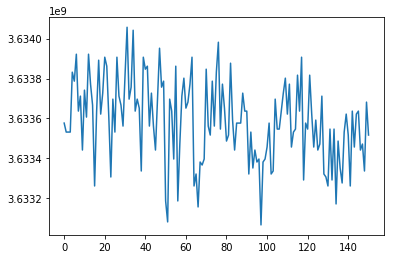

In [275]:
f0s_25 = get_f0s_from_data(35)
plt.plot(f0s_25)

([<matplotlib.axes._subplots.AxesSubplot at 0x1dcfc54ae10>,
  <matplotlib.colorbar.Colorbar at 0x1dcfc65d240>])

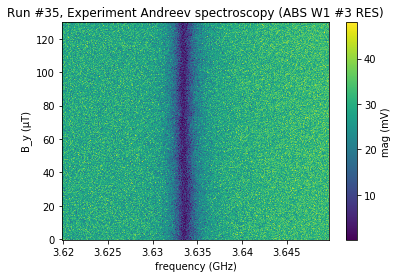

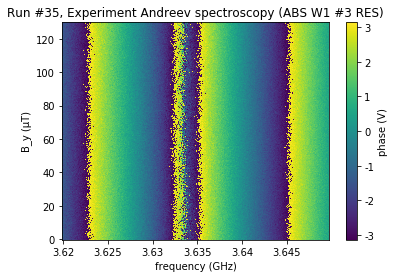

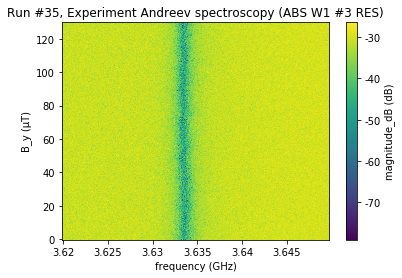

In [276]:
plot_by_id(35)

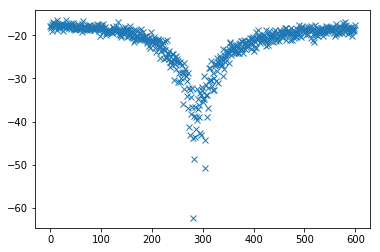

In [286]:
dat = load_by_id(36)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()
plt.plot(mags[3,:], 'x')

([<matplotlib.axes._subplots.AxesSubplot at 0x1ddce6212b0>,
  <matplotlib.colorbar.Colorbar at 0x1ddd9b8d9e8>])

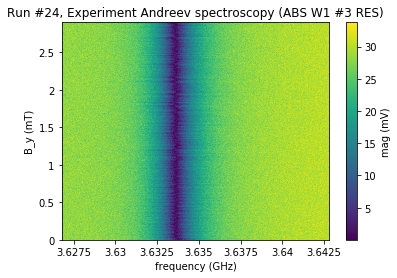

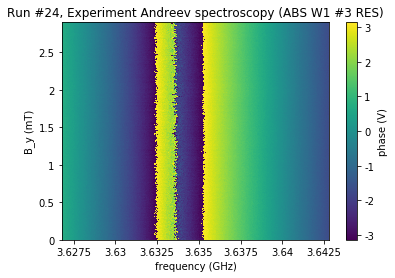

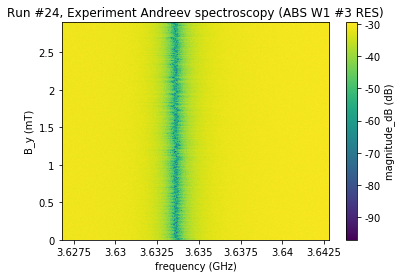

In [319]:
plot_by_id(24)

In [334]:
#initialize database
initialize_database('20190630')

database set to D:\OneDrive\BF3\Data\\20190630_ABS_W1_3_RES.db


([<matplotlib.axes._subplots.AxesSubplot at 0x1ddd9a629b0>,
  <matplotlib.colorbar.Colorbar at 0x1dde6a955f8>])

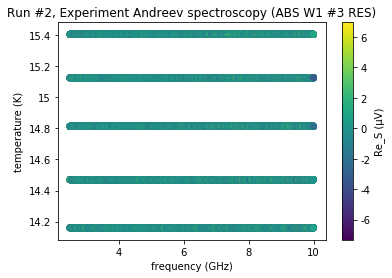

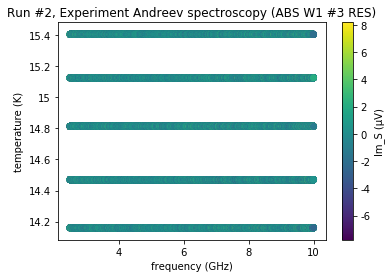

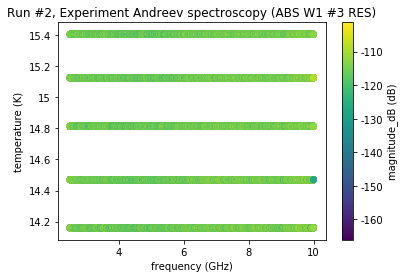

In [320]:
plot_by_id(2)

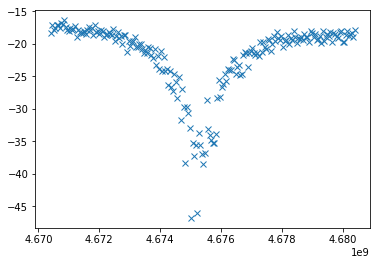

In [323]:
dat = load_by_id(2)
freqs = np.squeeze(dat.get_data('frequency'))
mags = np.squeeze(dat.get_data('magnitude_dB'))
B_fields = np.squeeze(dat.get_data('B_y'))
plt.figure()
plt.plot(freqs[3,:],mags[3,:], 'x')

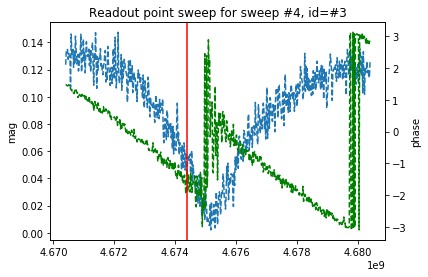

In [325]:
res_freqs = np.array([ 4.6754e9 ,5.6459e9, 3.6348e9,3.9983e9])
df = -1e6
plot_readout_point_from_sweep(3, f_readout = res_freqs[0]+df)

([<matplotlib.axes._subplots.AxesSubplot at 0x1de085aa048>,
 [None, None, None])

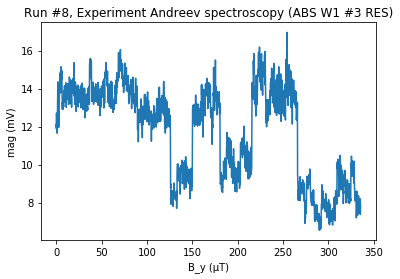

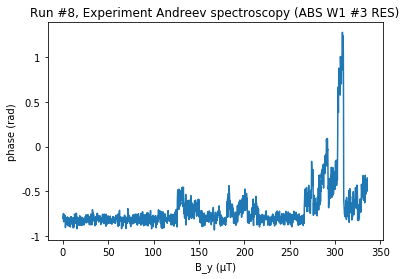

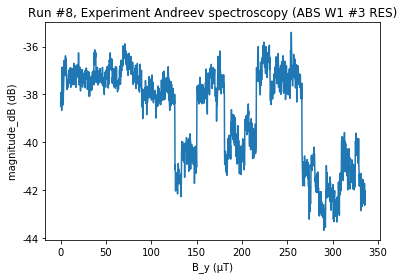

In [339]:
plot_by_id(8)

([<matplotlib.axes._subplots.AxesSubplot at 0x1ddf6c45ba8>,
  <matplotlib.colorbar.Colorbar at 0x1de082c9828>])

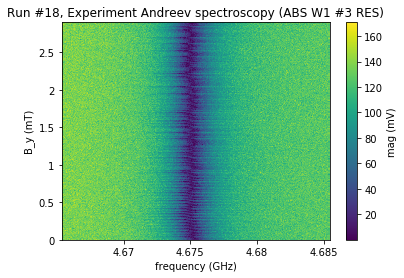

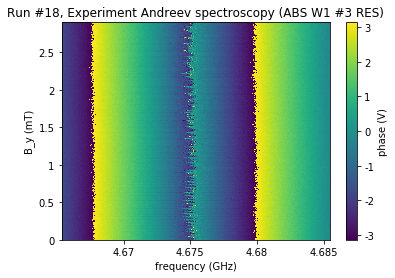

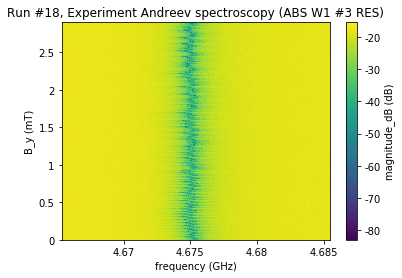

In [333]:
plot_by_id(18)

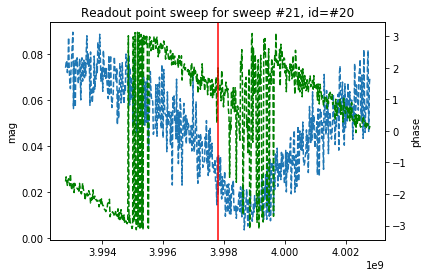

In [440]:
res_freqs = np.array([ 4.6754e9 ,5.6459e9, 3.6348e9,3.9983e9])
df = -0.5e6
plot_readout_point_from_sweep(20, f_readout = res_freqs[3]+df)

Text(0, 0.5, 'magnitude')

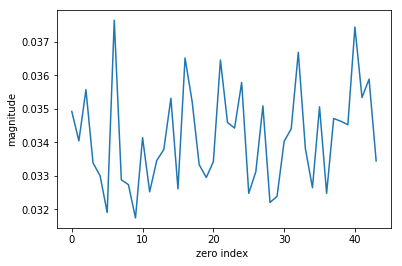

In [443]:
dat = unpack_data(23, col_names = ['power', 'B_y', 'mag', 'phase', 'magnitude_dB'])

plt.plot(dat['mag'][:])
plt.xlabel('zero index ')
plt.ylabel('magnitude')
#plt.ylim(0.018,0.028)

Text(0.5, 1.0, '#29')

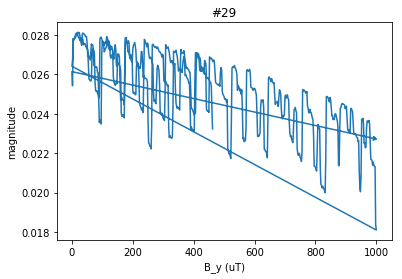

In [502]:
run_id = 29
dat = unpack_data(run_id, col_names = ['power', 'B_y', 'mag', 'phase', 'magnitude_dB'])

plt.plot(dat['B_y'][3000:]*1e6, dat['mag'][3000:])
plt.xlabel('B_y (uT)')
plt.ylabel('magnitude')
#plt.ylim(0.018,0.028)
plt.title('#%d'%run_id)

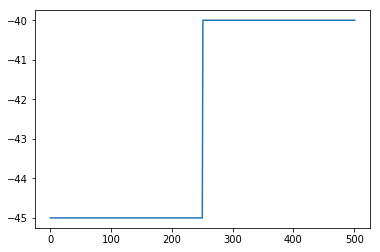

In [639]:
dat = load_by_id(39)

B_y = np.squeeze(dat.get_data('B_y')[0:502])
mags = np.squeeze(dat.get_data('mag')[0:502])
length = np.argmax(B_y)+1
powers = np.squeeze(dat.get_data('power')[0:502])

plt.plot(powers)

B_y = np.reshape(B_y, (-1, length))
mags = np.reshape(mags, (-1, length))
powers = np.reshape(powers, (-1, length))

Text(0.5, 0, 'By field')

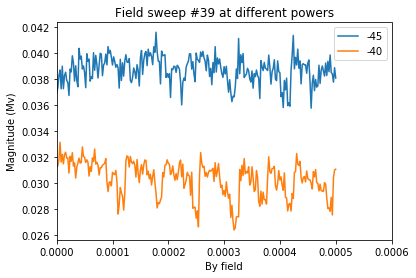

In [640]:
plt.plot(B_y[0,:],mags[0,:], label=powers[0,0])
plt.plot(B_y[0,:],mags[1,:],label=powers[1,0])
#plt.plot(B_y[0,:],mags[2,:],label=powers[2,0])
#plt.plot(B_y[0,:],mags[3,:],label=powers[3,0])
#plt.plot(mags[3,:])
#plt.plot(mags[4,:])
#plt.plot(B_y[0,:], mags[9,:], label=powers[9,0])
#plt.plot(B_y[0,:],mags[-1,:],label=powers[-1,0])
plt.xlim(0,600e-6)
plt.legend()
plt.ylabel('Magnitude (Mv)')
plt.title('Field sweep #39 at different powers')
plt.xlabel('By field')

In [634]:
plt.plot(B_y[0,:],mags[0,:], label=powers[0,0])
plt.plot(B_y[0,:],mags[1,:],label=powers[1,0])
#plt.plot(B_y[0,:],mags[2,:],label=powers[2,0])
#plt.plot(B_y[0,:],mags[3,:],label=powers[3,0])
#plt.plot(mags[3,:])
#plt.plot(mags[4,:])
#plt.plot(B_y[0,:], mags[9,:], label=powers[9,0])
#plt.plot(B_y[0,:],mags[-1,:],label=powers[-1,0])
plt.xlim(0,600e-6)
plt.legend()
plt.ylabel('Magnitude (Mv)')
plt.title('Field sweep at different powers')
plt.xlabel('By field')

IndexError: too many indices for array

In [607]:
dat = unpack_data(34, col_names=['magnitude_dB', 'frequency', 'power'])

In [615]:
plt.plot(dat['frequency'][3,:], dat['magnitude_dB'][7,:])

IndexError: index 7 is out of bounds for axis 0 with size 7

([<matplotlib.axes._subplots.AxesSubplot at 0x1de406f1b70>,
  <matplotlib.colorbar.Colorbar at 0x1de404ebb70>])

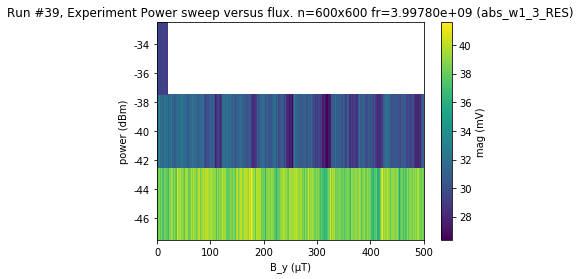

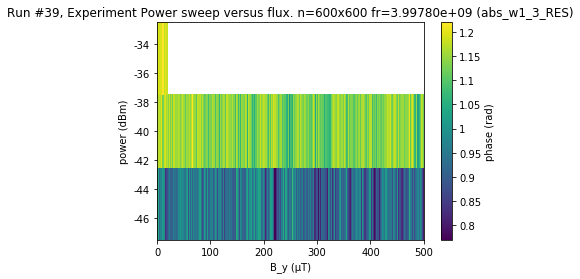

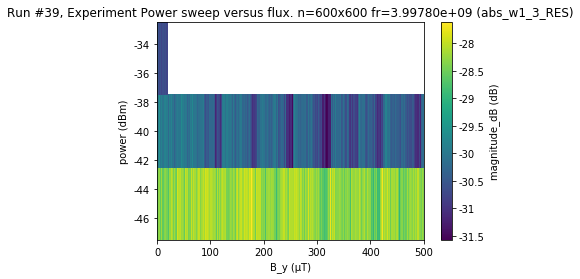

In [620]:
plot_by_id(39)

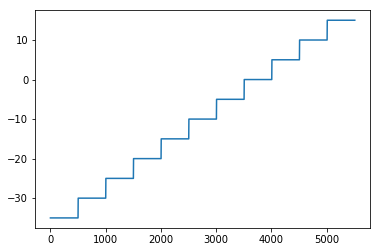

In [654]:
dat = load_by_id(29)

B_y = np.squeeze(dat.get_data('B_y'))
mags = np.squeeze(dat.get_data('mag'))
length = np.argmax(B_y)+1
powers = np.squeeze(dat.get_data('power'))

plt.plot(powers)

B_y = np.reshape(B_y, (-1, length))
mags = np.reshape(mags, (-1, length))
powers = np.reshape(powers, (-1, length))

plot_by_id(42)

Text(0.5, 0, 'By field')

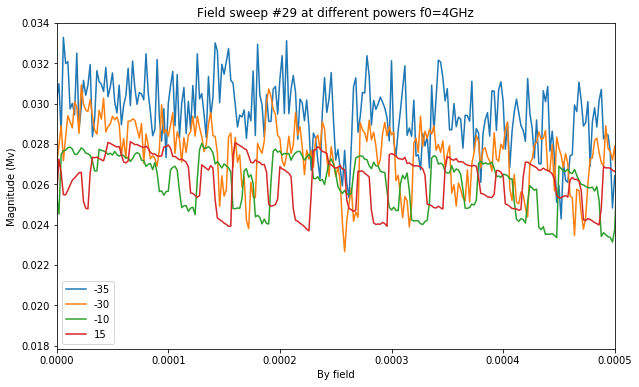

In [663]:
dat = load_by_id(29)

B_y = np.squeeze(dat.get_data('B_y'))
mags = np.squeeze(dat.get_data('mag'))
length = np.argmax(B_y)+1
powers = np.squeeze(dat.get_data('power'))

plt.plot(powers)

B_y = np.reshape(B_y, (-1, length))
mags = np.reshape(mags, (-1, length))
powers = np.reshape(powers, (-1, length))


plt.figure(figsize=(10,6))
plt.plot(B_y[0,:],mags[0,:], label=powers[0,0])
plt.plot(B_y[0,:],mags[1,:],label=powers[1,0])
#plt.plot(B_y[0,:],mags[2,:],label=powers[2,0])
#plt.plot(B_y[0,:],mags[3,:],label=powers[3,0])
#plt.plot(mags[3,:])
#plt.plot(mags[4,:])
plt.plot(B_y[0,:], mags[5,:], label=powers[5,0])
plt.plot(B_y[0,:],mags[-1,:],label=powers[-1,0])
plt.xlim(0,500e-6)
plt.legend()
plt.ylabel('Magnitude (Mv)')
plt.title('Field sweep #29 at different powers f0=4GHz')
plt.xlabel('By field')


([<matplotlib.axes._subplots.AxesSubplot at 0x1de4b8e4080>,
  <matplotlib.colorbar.Colorbar at 0x1de4ba22b70>])

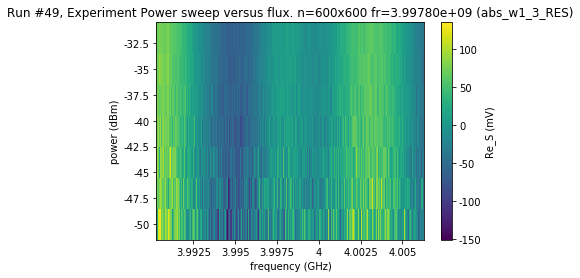

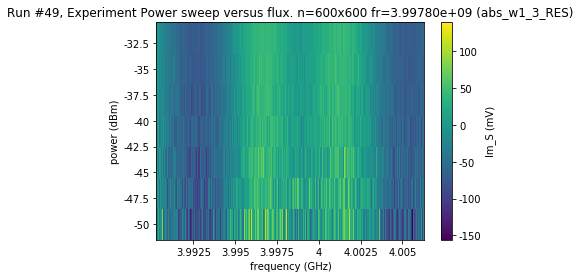

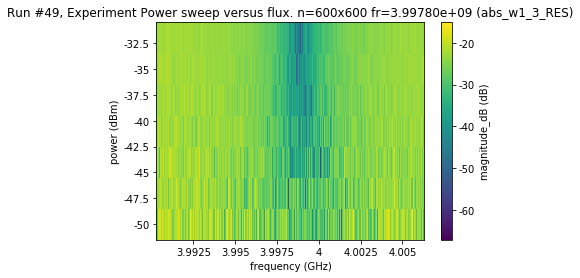

In [651]:
plot_by_id(49)

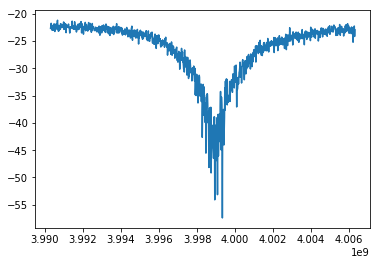

In [666]:
dat=unpack_data(49, col_names = ['frequency','power','magnitude_dB'])
plt.plot(dat['frequency'][2,:], dat['magnitude_dB'][-1,:])

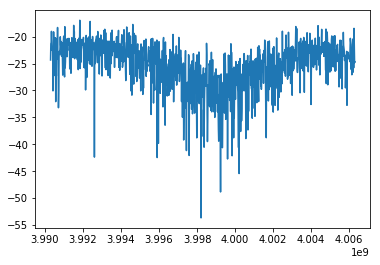

In [646]:
dat=unpack_data(49, col_names = ['frequency','power','magnitude_dB'])
plt.plot(dat['frequency'][1,:], dat['magnitude_dB'][1,:])

([<matplotlib.axes._subplots.AxesSubplot at 0x1de4f12feb8>,
  <matplotlib.colorbar.Colorbar at 0x1de4f264780>])

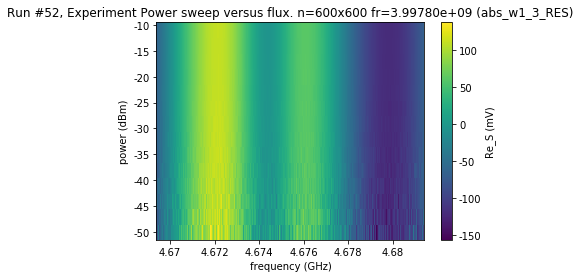

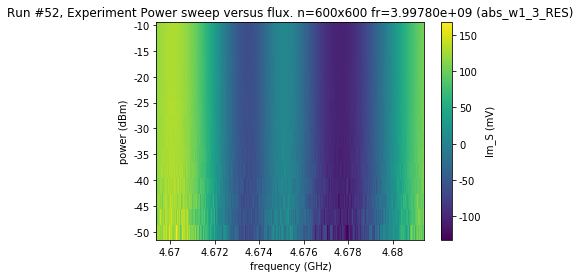

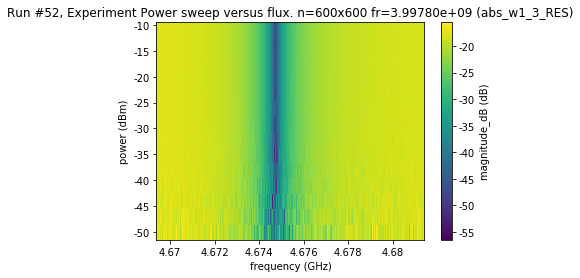

In [672]:
plot_by_id(52)

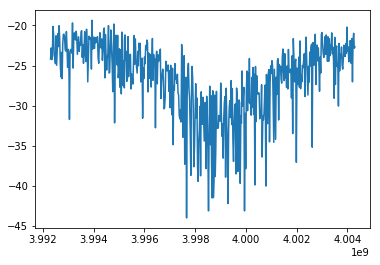

In [668]:
dat=unpack_data(50, col_names = ['frequency','power','magnitude_dB'])
plt.plot(dat['frequency'], dat['magnitude_dB'])

([<matplotlib.axes._subplots.AxesSubplot at 0x1de51a789b0>,
  <matplotlib.colorbar.Colorbar at 0x1de51ba1a58>])

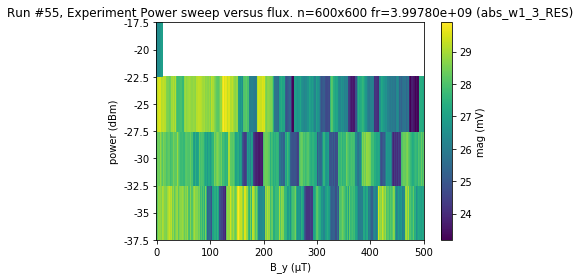

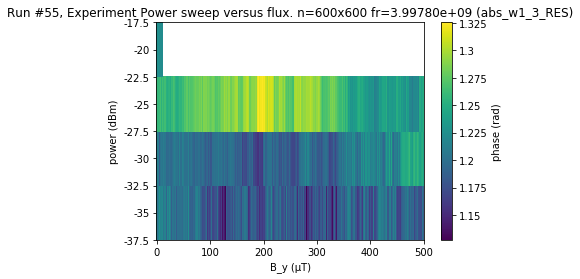

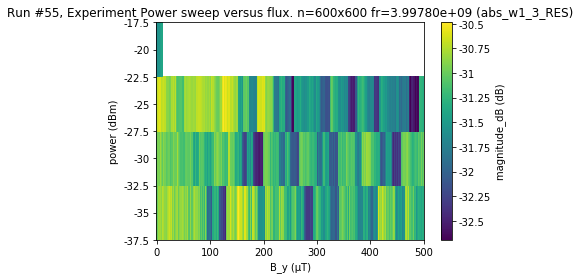

In [696]:
plot_by_id(55)

## analysis of slow flux sweep single freq. 02/07


Text(0.5, 0, 'By field')

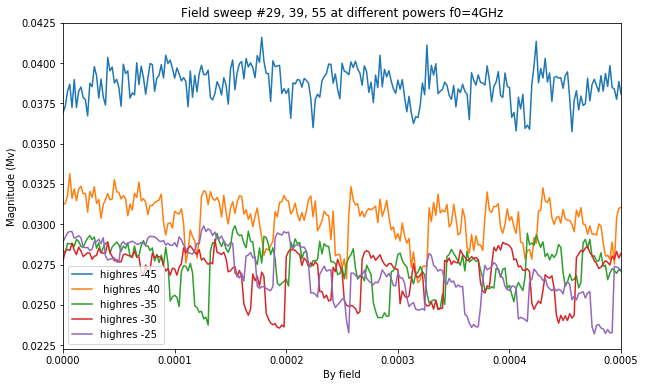

In [698]:
#load in dat of resonator 4GHz
dat = load_by_id(29)
B_y = np.squeeze(dat.get_data('B_y'))
mags = np.squeeze(dat.get_data('mag'))
length = np.argmax(B_y)+1
powers = np.squeeze(dat.get_data('power'))


B_y = np.reshape(B_y, (-1, length))
mags = np.reshape(mags, (-1, length))
powers = np.reshape(powers, (-1, length))



#now also load the dat with higher res (first two traces)

dat2 = load_by_id(39)

B_y2 = np.squeeze(dat2.get_data('B_y')[0:502])
mags2 = np.squeeze(dat2.get_data('mag')[0:502])
length2 = np.argmax(B_y2)+1
powers2 = np.squeeze(dat2.get_data('power')[0:502])
B_y2 = np.reshape(B_y2, (-1, length2))
mags2 = np.reshape(mags2, (-1, length2))
powers2 = np.reshape(powers2, (-1, length2))


#now also load the dat with higher res (first two traces)

dat3 = load_by_id(55)

B_y3 = np.squeeze(dat3.get_data('B_y')[0:753])
mags3 = np.squeeze(dat3.get_data('mag')[0:753])
length3 = np.argmax(B_y3)+1
powers3 = np.squeeze(dat3.get_data('power')[0:753])
B_y3 = np.reshape(B_y3, (-1, length3))
mags3 = np.reshape(mags3, (-1, length3))
powers3 = np.reshape(powers3, (-1, length3))



plt.figure(figsize=(10,6))
#plt.plot(B_y[0,:],mags[0,:], label=powers[0,0])
#plt.plot(B_y[0,:],mags[9,:],label=powers[9,0])
plt.plot(B_y2[0,:],mags2[0,:], label='highres %d' % powers2[0,0])
plt.plot(B_y2[0,:],mags2[1,:],label=' highres %d' % powers2[1,0])

plt.plot(B_y3[0,:],mags3[0,:], label='highres %d' % powers3[0,0])
plt.plot(B_y3[0,:],mags3[1,:], label='highres %d' % powers3[1,0])
plt.plot(B_y3[0,:],mags3[2,:], label='highres %d' % powers3[2,0])
#plt.plot(B_y3[0,:],mags3[1,:],label=powers3[1,0])

#plt.plot(B_y[0,:],mags[2,:],label=powers[2,0])
#plt.plot(B_y[0,:],mags[3,:],label=powers[3,0])
#plt.plot(mags[3,:])
#plt.plot(mags[4,:])
#plt.plot(B_y[0,:], mags[5,:], label=powers[5,0])
#plt.plot(B_y[0,:],mags[-1,:],label=powers[-1,0])
plt.xlim(0,500e-6)
plt.legend()
plt.ylabel('Magnitude (Mv)')
plt.title('Field sweep #29, 39, 55 at different powers f0=4GHz')
plt.xlabel('By field')






In [680]:
np.shape(powers2)
length2

501

([<matplotlib.axes._subplots.AxesSubplot at 0x1de531e9dd8>,
  <matplotlib.colorbar.Colorbar at 0x1de53334198>])

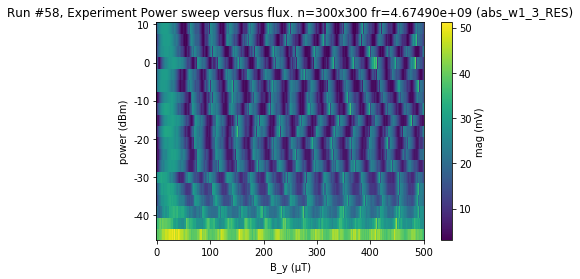

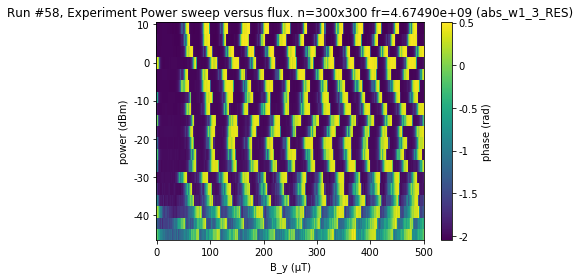

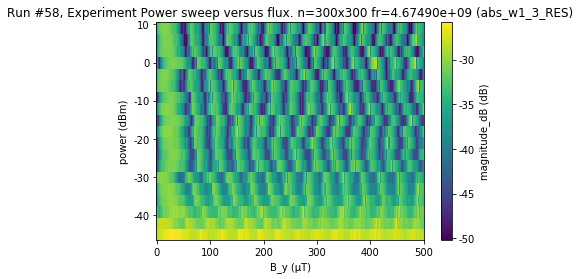

In [707]:
plot_by_id(58)

In [716]:
dat2 = load_by_id(58)


l = 251
B_y2 = np.squeeze(dat2.get_data('B_y'))
mags2 = np.squeeze(dat2.get_data('mag'))
length2 = np.argmax(B_y2)+1
powers2 = np.squeeze(dat2.get_data('power'))
B_y2 = np.reshape(B_y2, (-1, length2))
mags2 = np.reshape(mags2, (-1, length2))
powers2 = np.reshape(powers2, (-1, length2))


Text(0.5, 1.0, 'id#58 4.6GHZ resonator power vs flux')

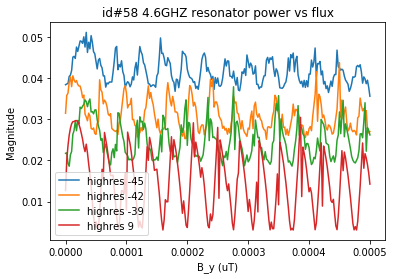

In [718]:
plt.plot(B_y2[0,:],mags2[0,:], label='highres %d' % powers2[0,0])
plt.plot(B_y2[0,:],mags2[1,:], label='highres %d' % powers2[1,0])
plt.plot(B_y2[0,:],mags2[2,:], label='highres %d' % powers2[2,0])
#plt.plot(B_y2[0,:],mags2[3,:], label='highres %d' % powers2[3,0])
#plt.plot(B_y2[0,:],mags2[4,:], label='highres %d' % powers2[4,0])
#plt.plot(B_y2[0,:],mags2[5,:], label='highres %d' % powers2[5,0])
plt.plot(B_y2[0,:],mags2[-1,:], label='highres %d' % powers2[-1,0])
plt.legend()
plt.xlabel('B_y (uT)')
plt.ylabel('Magnitude ')
plt.title('id#58 4.6GHZ resonator power vs flux')

([<matplotlib.axes._subplots.AxesSubplot at 0x1de5469f518>,
  <matplotlib.colorbar.Colorbar at 0x1de547f9ef0>])

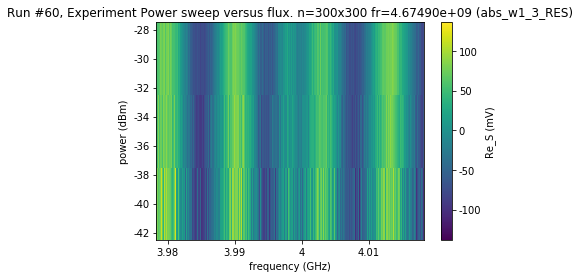

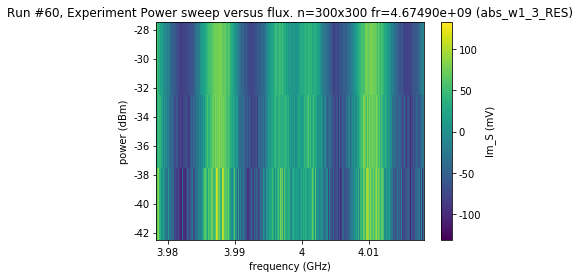

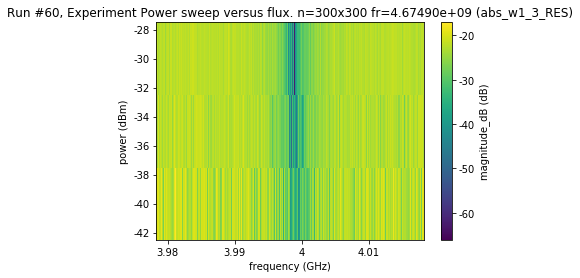

In [719]:
plot_by_id(60)

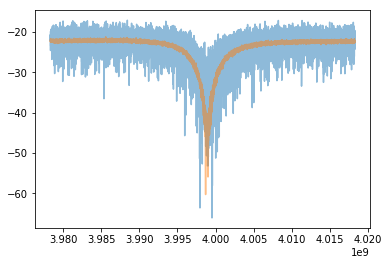

In [724]:
dat=unpack_data(60, col_names = ['frequency','power','magnitude_dB'])
plt.plot(dat['frequency'][0,:], dat['magnitude_dB'][0,:], alpha=0.5)
plt.plot(dat['frequency'][0,:], dat['magnitude_dB'][4,:], alpha=0.5)